<a href="https://colab.research.google.com/github/Aravindh4404/FYPSeagullClassification01/blob/main/VGGnet_HQ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Using device: cuda
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 171MB/s]


Epoch [1/30] - Training Loss: 0.433059
Validation Accuracy: 94.74%
Checkpoint saved for epoch 1 at /content/drive/My Drive/FYP/VGGModel/HQ3latst_20250216/checkpoint_model_vgg_20250216.pth
Epoch [2/30] - Training Loss: 0.272175
Validation Accuracy: 97.37%
Checkpoint saved for epoch 2 at /content/drive/My Drive/FYP/VGGModel/HQ3latst_20250216/checkpoint_model_vgg_20250216.pth
Epoch [3/30] - Training Loss: 0.148557
Validation Accuracy: 94.74%
Checkpoint saved for epoch 3 at /content/drive/My Drive/FYP/VGGModel/HQ3latst_20250216/checkpoint_model_vgg_20250216.pth
Epoch [4/30] - Training Loss: 0.051052
Validation Accuracy: 94.74%
Checkpoint saved for epoch 4 at /content/drive/My Drive/FYP/VGGModel/HQ3latst_20250216/checkpoint_model_vgg_20250216.pth
Epoch [5/30] - Training Loss: 0.096763
Validation Accuracy: 86.84%
Checkpoint saved for epoch 5 at /content/drive/My Drive/FYP/VGGModel/HQ3latst_20250216/checkpoint_model_vgg_20250216.pth
Epoch [6/30] - Training Loss: 0.121891
Validation Accuracy: 

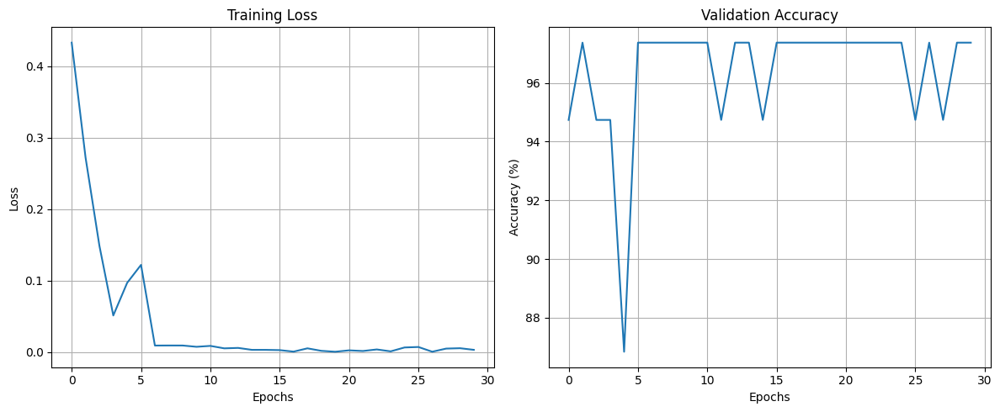

Final model saved at /content/drive/My Drive/FYP/VGGModel/HQ3latst_20250216/final_model_vgg_20250216.pth
Test Loss: 1.992672, Test Accuracy: 94.87%


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import random
import matplotlib.pyplot as plt
from datetime import datetime

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Define the device for computation
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Mount Google Drive to save and load the model (if using Google Colab)
from google.colab import drive
drive.mount('/content/drive')

# Define the folder to save model checkpoints
date_str = datetime.now().strftime('%Y%m%d')
checkpoint_folder = f'/content/drive/My Drive/FYP/VGGModel/HQ3latst_{date_str}/'
os.makedirs(checkpoint_folder, exist_ok=True)

# Data Augmentation for Training Set
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),  # VGG expects 224x224 input size
    transforms.RandomHorizontalFlip(p=0.5),  # Flip left/right
    transforms.RandomVerticalFlip(p=0.3),  # Flip up/down
    transforms.RandomRotation(degrees=10),  # Small rotation
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),  # Slight shifts
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),  # Small color changes
    transforms.RandomResizedCrop(300, scale=(0.95, 1.0)),  # Crop slightly
    transforms.RandomAdjustSharpness(sharpness_factor=1.2, p=0.3),  # Enhance details slightly
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Simple resizing for validation and test sets
transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Load datasets
data_path = '/content/drive/My Drive/FYP/Dataset/HQ3/train'
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQ3/test'
train_dataset = datasets.ImageFolder(data_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_data_path, transform=transform_val_test)

# Split the dataset into 85% training and 15% validation
train_size = int(0.85 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

# Create data loaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use Pre-trained VGG-16 model and modify it for binary classification
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        from torchvision.models import VGG16_Weights
        self.vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        # Replace the classifier with a custom binary classification layer
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize the VGG model
model = VGG16Modified().to(device)

# Define loss function and optimizer with L2 regularization (weight decay)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3)

def train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=30):
    train_losses = []
    val_accuracies = []

    # Single checkpoint file to be replaced each epoch
    checkpoint_model_path = os.path.join(checkpoint_folder, f"checkpoint_model_vgg_{date_str}.pth")

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()

            # Gradient clipping (optional)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
            optimizer.step()

            running_loss += loss.item()

        # Calculate and print training loss
        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)
        print(f"Epoch [{epoch+1}/{epochs}] - Training Loss: {train_loss:.6f}")

        # Validate the model
        val_acc = validate(model, val_loader)
        val_accuracies.append(val_acc)
        scheduler.step(val_acc)

        # Save (overwrite) checkpoint at each epoch
        torch.save(model.state_dict(), checkpoint_model_path)
        print(f"Checkpoint saved for epoch {epoch+1} at {checkpoint_model_path}")

    # Plot training & validation metrics
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.title('Validation Accuracy')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Finally, save a "final model" file (may be the same as checkpoint if we want)
    final_model_path = os.path.join(checkpoint_folder, f"final_model_vgg_{date_str}.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"Final model saved at {final_model_path}")


def validate(model, loader):
    """Validation loop returning accuracy."""
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100.0 * correct / total
    print(f'Validation Accuracy: {accuracy:.2f}%')
    return accuracy


def test(model, loader, criterion):
    """Evaluate the model on the test set."""
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100.0 * correct / total
    print(f'Test Loss: {test_loss/len(loader):.6f}, Test Accuracy: {accuracy:.2f}%')

# ------------------- Main Training & Testing Routine -------------------
if __name__ == "__main__":
    # Train the model
    train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=30)

    # Evaluate the model on the test set
    test(model, test_loader, criterion)


Using device: cpu
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:05<00:00, 107MB/s] 
<ipython-input-4-49033e73d22c>:63: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. 

Loaded model from /content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth
Test Loss: 0.018551
Test Accuracy: 100.00%
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Test metrics plot saved at /content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/test_metrics.png


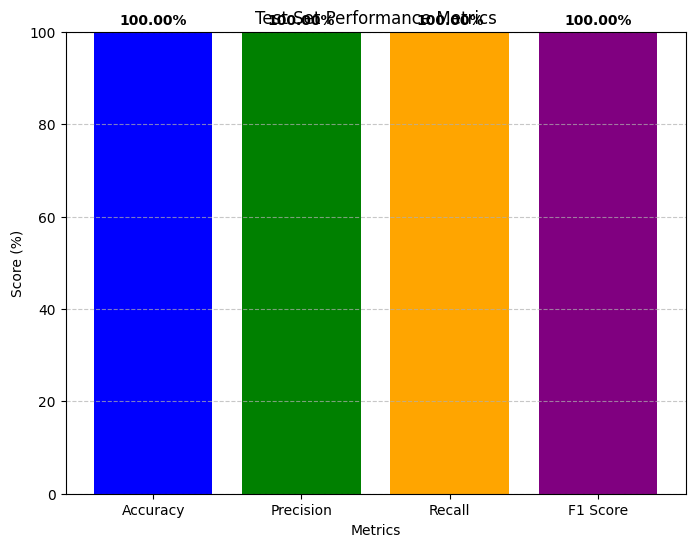

Confusion matrix plot saved at /content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/confusion_matrix.png


<Figure size 600x600 with 0 Axes>

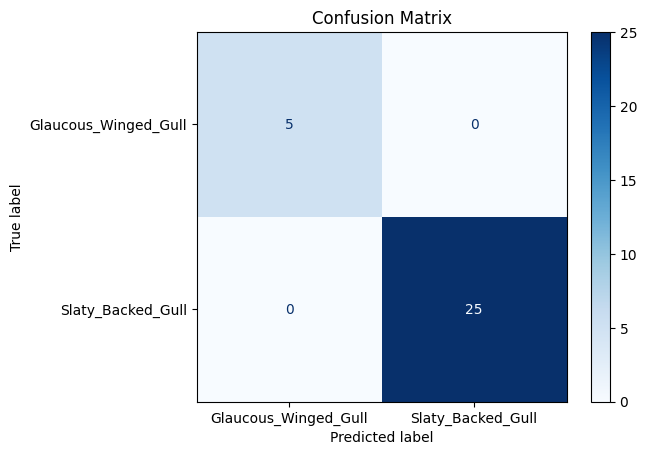

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np  # Ensure NumPy is imported
import random
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Define the device for computation
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the folder where the best model is saved
date_str = '20241123'  # Replace with your actual date string
checkpoint_folder = f'/content/drive/My Drive/FYP/VGGModel/HQ2ltst_{date_str}/'
os.makedirs(checkpoint_folder, exist_ok=True)
best_model_filename = f"best_model_vgg_{date_str}.pth"
best_model_path = os.path.join(checkpoint_folder, best_model_filename)

# Data transformations for test set
transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Load test dataset
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'  # Update this path if different
test_dataset = datasets.ImageFolder(test_data_path, transform=transform_val_test)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Define the VGG16Modified model
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        # Load the pre-trained VGG16 model
        self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        # Replace the classifier's last layer for binary classification
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize the model and load the saved weights
model = VGG16Modified().to(device)
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()  # Set model to evaluation mode
print(f"Loaded model from {best_model_path}")

# Define loss function
criterion = nn.CrossEntropyLoss()

# Define the test function
def test(model, loader, criterion):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    accuracy = 100 * correct / total
    precision = precision_score(all_labels, all_predictions, average='binary')
    recall = recall_score(all_labels, all_predictions, average='binary')
    f1 = f1_score(all_labels, all_predictions, average='binary')

    print(f'Test Loss: {test_loss/len(loader):.6f}')
    print(f'Test Accuracy: {accuracy:.2f}%')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1 Score: {f1:.2f}')

    return accuracy, precision, recall, f1, all_labels, all_predictions

# Run the test
test_accuracy, test_precision, test_recall, test_f1, all_labels, all_predictions = test(model, test_loader, criterion)

# Function to plot test metrics
def plot_test_metrics(accuracy, precision, recall, f1, checkpoint_folder):
    # Define metrics and their corresponding values
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    scores = [accuracy, precision * 100, recall * 100, f1 * 100]  # Convert to percentages

    # Create a bar chart
    plt.figure(figsize=(8, 6))
    bars = plt.bar(metrics, scores, color=['blue', 'green', 'orange', 'purple'])

    # Add score labels above each bar
    for bar, score in zip(bars, scores):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{score:.2f}%', ha='center', va='bottom', fontweight='bold')

    plt.ylim(0, 100)
    plt.title('Test Set Performance Metrics')
    plt.ylabel('Score (%)')
    plt.xlabel('Metrics')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Save the plot
    plot_path = os.path.join(checkpoint_folder, 'test_metrics.png')
    plt.savefig(plot_path)
    print(f"Test metrics plot saved at {plot_path}")
    plt.show()

# Plot the metrics
plot_test_metrics(test_accuracy, test_precision, test_recall, test_f1, checkpoint_folder)

# Function to plot confusion matrix
def plot_confusion_matrix(all_labels, all_predictions, checkpoint_folder, class_names):
    cm = confusion_matrix(all_labels, all_predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    plt.figure(figsize=(6, 6))
    disp.plot(cmap=plt.cm.Blues, values_format='d')
    plt.title('Confusion Matrix')

    # Save the confusion matrix plot
    cm_plot_path = os.path.join(checkpoint_folder, 'confusion_matrix.png')
    plt.savefig(cm_plot_path)
    print(f"Confusion matrix plot saved at {cm_plot_path}")
    plt.show()

# Get class names from the test dataset
class_names = test_dataset.classes

# Plot the confusion matrix
plot_confusion_matrix(all_labels, all_predictions, checkpoint_folder, class_names)


In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'
test_folder_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'  # Replace with your test folder path

# Load the trained VGG model
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        from torchvision.models import VGG16_Weights
        self.vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        # Replace the classifier with a custom binary classification layer
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize and load the model
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']  # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize to match VGG input size
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # ImageNet normalization
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Grad-CAM implementation
def generate_gradcam(model, image_tensor, target_layer):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture feature maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the target layer
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and feature maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1, 2))  # Global average pooling of gradients
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1
    return cam, predicted_class_idx

# Saliency Map implementation
def generate_saliency_map(model, image_tensor):
    image_tensor.requires_grad_()
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to calculate gradients
    model.zero_grad()
    output[0, predicted_class_idx].backward()

    # Calculate saliency
    saliency = image_tensor.grad.data.abs()
    saliency, _ = torch.max(saliency, dim=1)  # Take max across channels
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize for visualization
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency, predicted_class_idx

# Function to visualize results
def visualize_results(image_path, gradcam, saliency, predicted_class):
    original_image = Image.open(image_path).resize((224, 224), Image.LANCZOS)
    original_image = np.array(original_image)

    # Grad-CAM heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    gradcam_image = np.clip(0.4 * heatmap + 0.6 * original_image, 0, 255).astype(np.uint8)

    # Plot images
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Grad-CAM
    plt.subplot(1, 3, 2)
    plt.title(f"Grad-CAM: {class_names[predicted_class]}")
    plt.imshow(gradcam_image)
    plt.axis('off')

    # Saliency Map
    plt.subplot(1, 3, 3)
    plt.title(f"Saliency Map: {class_names[predicted_class]}")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process all images in the test folder
def process_test_folder(test_folder_path):
    target_layer = model.vgg.features[-1]  # Target the last convolutional layer
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Generate Grad-CAM and Saliency Map
            gradcam, predicted_class_idx_cam = generate_gradcam(model, image_tensor, target_layer)
            saliency, predicted_class_idx_sal = generate_saliency_map(model, image_tensor)

            # Ensure predictions from both methods match
            assert predicted_class_idx_cam == predicted_class_idx_sal, "Predicted class mismatch!"

            # Visualize results
            visualize_results(image_path, gradcam, saliency, predicted_class_idx_cam)

# Run the combined implementation on all images in the test folder
process_test_folder(test_folder_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-2-1751351ace1a>:38: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))


Accuracy: 100.00%
Precision: 1.00
Recall: 1.00
F1 Score: 1.00

Classification Report:
                      precision    recall  f1-score   support

Glaucous_Winged_Gull       1.00      1.00      1.00         6
   Slaty_Backed_Gull       1.00      1.00      1.00        25

            accuracy                           1.00        31
           macro avg       1.00      1.00      1.00        31
        weighted avg       1.00      1.00      1.00        31



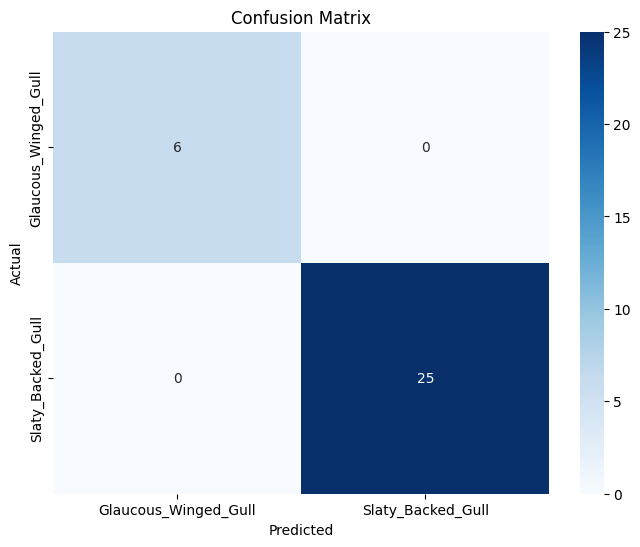

In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, classification_report
import seaborn as sns

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'
test_folder_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'  # Replace with your test folder path

# Load the trained VGG model
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        from torchvision.models import VGG16_Weights
        self.vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        # Replace the classifier with a custom binary classification layer
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize and load the model
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']  # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize to match VGG input size
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # ImageNet normalization
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Function to evaluate the model on the test set
def evaluate_test_set(model, test_folder_path, class_names):
    model.eval()
    all_labels = []
    all_predictions = []

    # Iterate through test folder
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            label = os.path.basename(root)  # Assumes folder name represents the class label
            if label not in class_names:
                continue  # Skip unknown classes

            # Preprocess the image
            image_tensor = preprocess_image(image_path)
            outputs = model(image_tensor)

            # Prediction
            _, predicted = torch.max(outputs, 1)
            all_labels.append(class_names.index(label))  # Convert folder name to label index
            all_predictions.append(predicted.item())

    # Calculate metrics
    accuracy = 100 * np.sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)
    precision = precision_score(all_labels, all_predictions, average='weighted')
    recall = recall_score(all_labels, all_predictions, average='weighted')
    f1 = f1_score(all_labels, all_predictions, average='weighted')
    cm = confusion_matrix(all_labels, all_predictions)

    # Print results
    print(f'Accuracy: {accuracy:.2f}%')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1 Score: {f1:.2f}')
    print(f'\nClassification Report:\n{classification_report(all_labels, all_predictions, target_names=class_names)}')

    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

# Run the evaluation on the test folder
evaluate_test_set(model, test_folder_path, class_names)


In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'
test_folder_path = '/content/drive/My Drive/FYP/BOOK_IMAGES_GULL'  # Replace with your test folder path

# Load the trained VGG model
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        from torchvision.models import VGG16_Weights
        self.vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        # Replace the classifier with a custom binary classification layer
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize and load the model
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']  # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize to match VGG input size
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # ImageNet normalization
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Grad-CAM implementation
def generate_gradcam(model, image_tensor, target_layer):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture feature maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the target layer
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and feature maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1, 2))  # Global average pooling of gradients
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1
    return cam, predicted_class_idx

# Saliency Map implementation
def generate_saliency_map(model, image_tensor):
    image_tensor.requires_grad_()
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to calculate gradients
    model.zero_grad()
    output[0, predicted_class_idx].backward()

    # Calculate saliency
    saliency = image_tensor.grad.data.abs()
    saliency, _ = torch.max(saliency, dim=1)  # Take max across channels
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize for visualization
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency, predicted_class_idx

# Function to visualize results
def visualize_results(image_path, gradcam, saliency, predicted_class):
    original_image = Image.open(image_path).resize((224, 224), Image.LANCZOS)
    original_image = np.array(original_image)

    # Grad-CAM heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    gradcam_image = np.clip(0.4 * heatmap + 0.6 * original_image, 0, 255).astype(np.uint8)

    # Plot images
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Grad-CAM
    plt.subplot(1, 3, 2)
    plt.title(f"Grad-CAM: {class_names[predicted_class]}")
    plt.imshow(gradcam_image)
    plt.axis('off')

    # Saliency Map
    plt.subplot(1, 3, 3)
    plt.title(f"Saliency Map: {class_names[predicted_class]}")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process all images in the test folder
def process_test_folder(test_folder_path):
    target_layer = model.vgg.features[-1]  # Target the last convolutional layer
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Generate Grad-CAM and Saliency Map
            gradcam, predicted_class_idx_cam = generate_gradcam(model, image_tensor, target_layer)
            saliency, predicted_class_idx_sal = generate_saliency_map(model, image_tensor)

            # Ensure predictions from both methods match
            assert predicted_class_idx_cam == predicted_class_idx_sal, "Predicted class mismatch!"

            # Visualize results
            visualize_results(image_path, gradcam, saliency, predicted_class_idx_cam)

# Run the combined implementation on all images in the test folder
process_test_folder(test_folder_path)


In [ ]:
!pip install captum

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 36.1 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 30.9 MB/s eta 0:00:00


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 145MB/s]
<ipython-input-2-703d3438f5c5>:39: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. P

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241203_010634.jpg


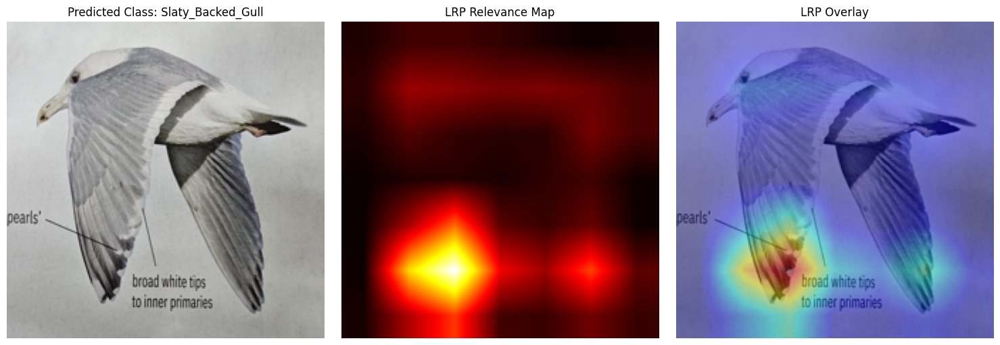

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241203_010647.jpg


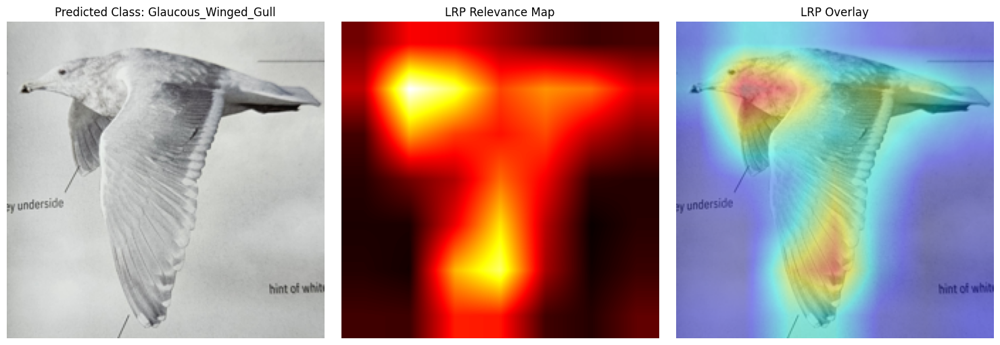

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241204_141028(1).jpg


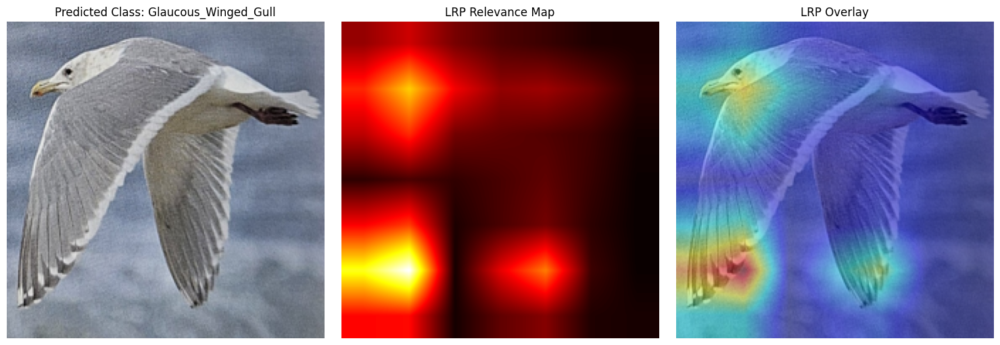

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241204_140935.jpg


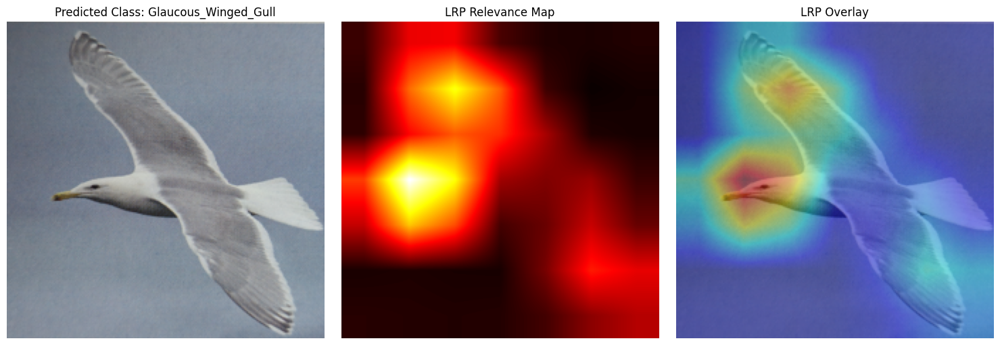

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241204_140922.jpg


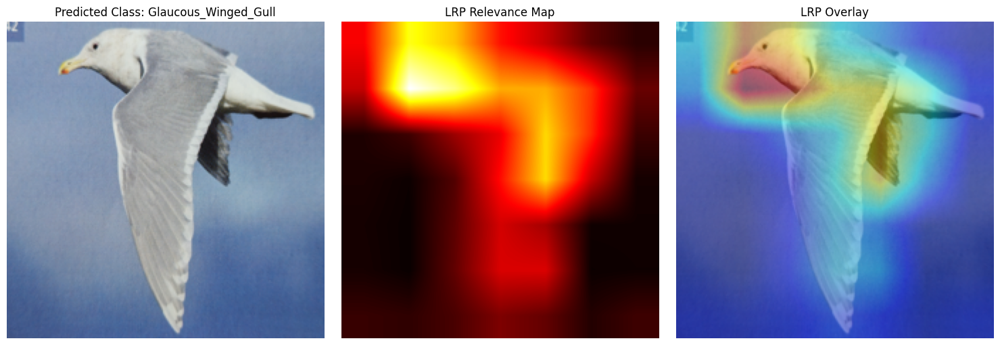

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241204_170956.jpg


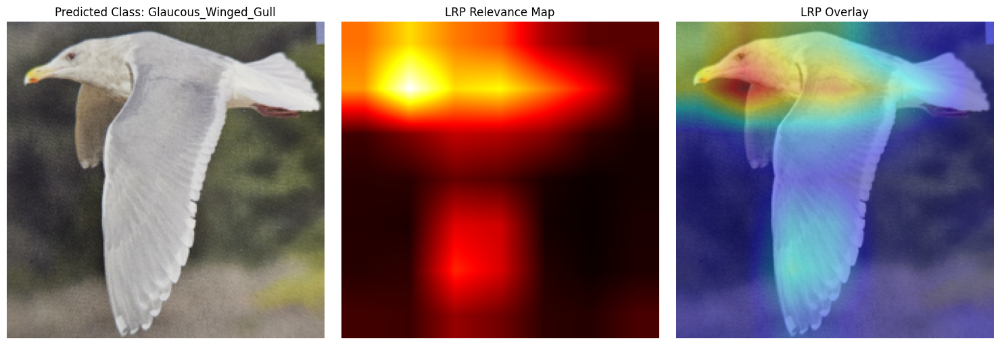

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241204_171004.jpg


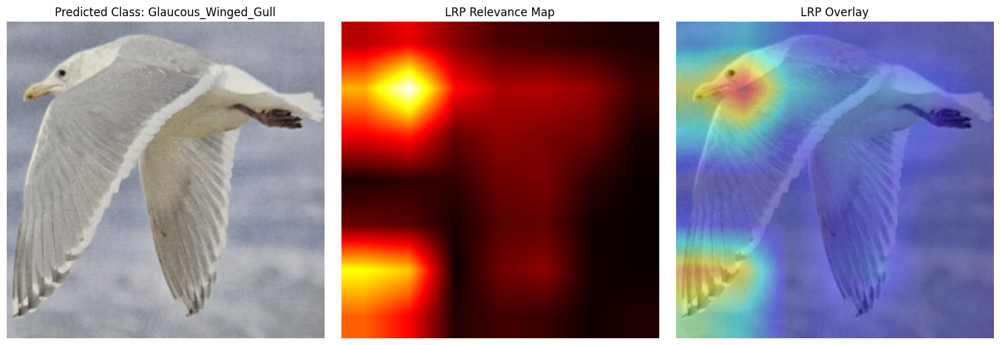

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Glaucous_Winged_Gull/20241204_171110.jpg


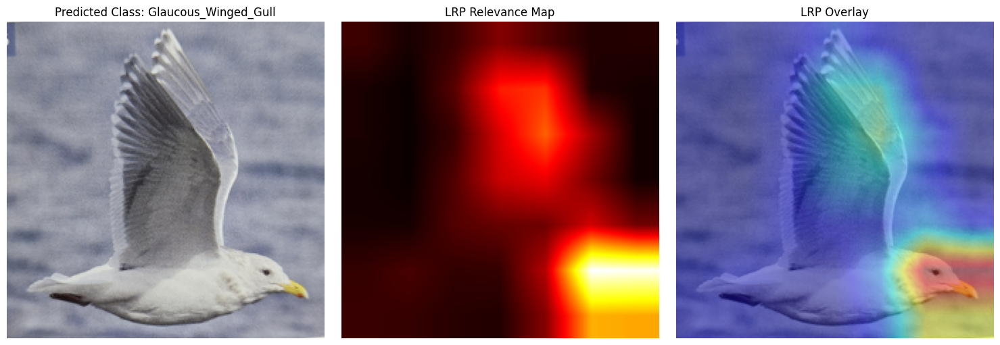

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_141619.jpg


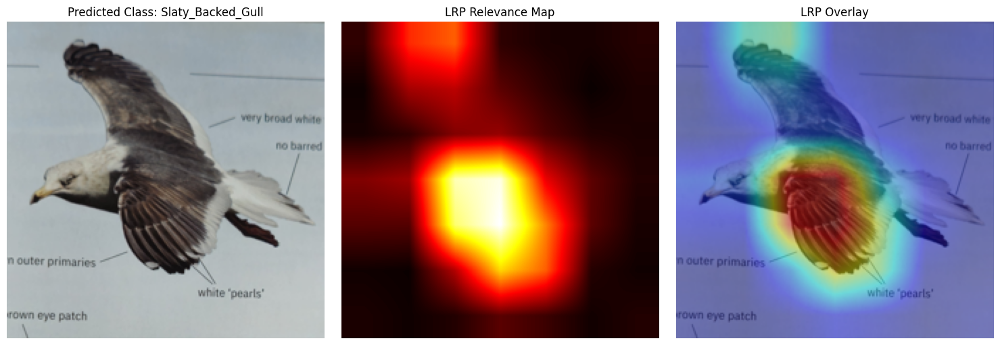

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_141608.jpg


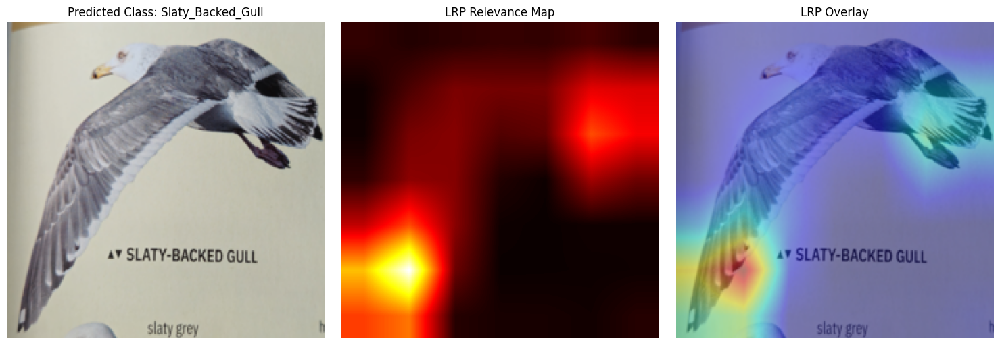

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_141506.jpg


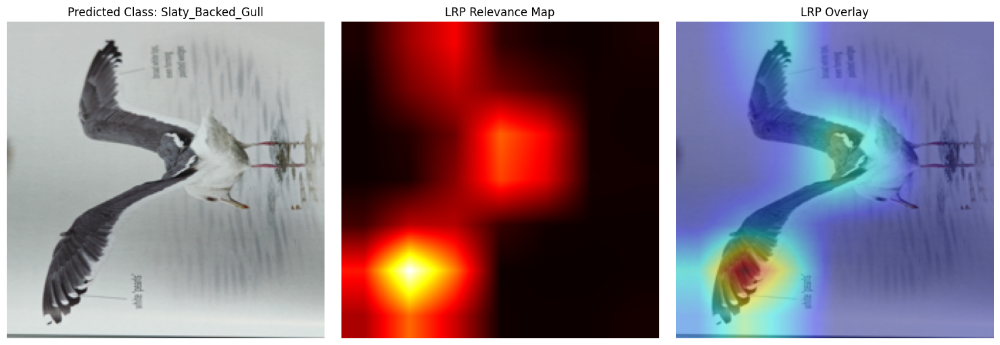

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_141028(1).jpg


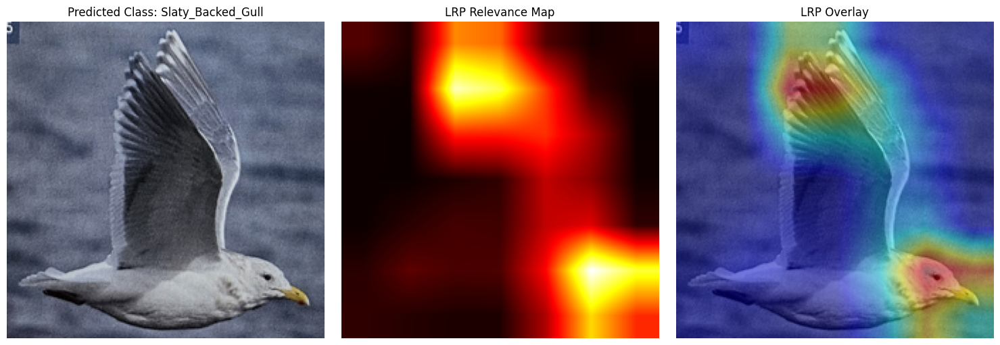

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_170328.jpg


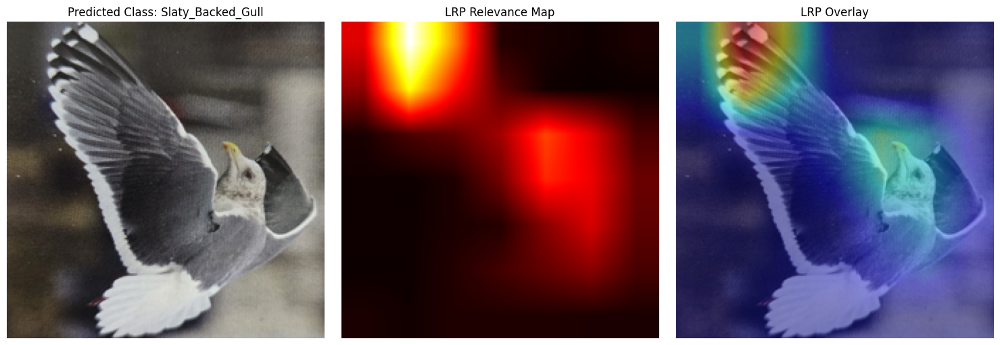

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_170332.jpg


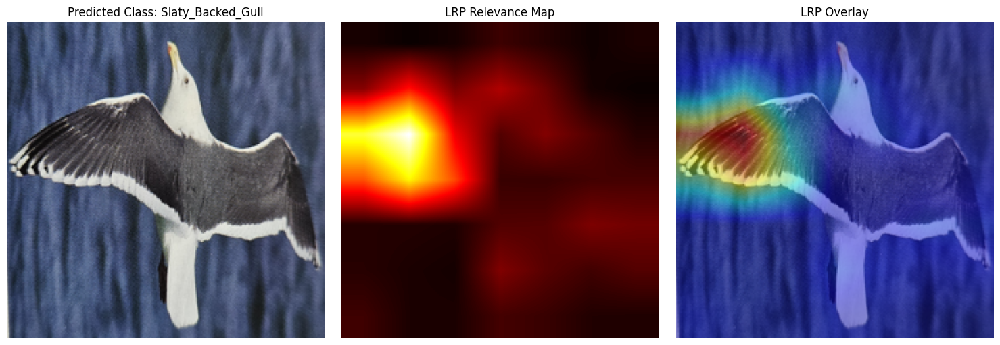

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_170314.jpg


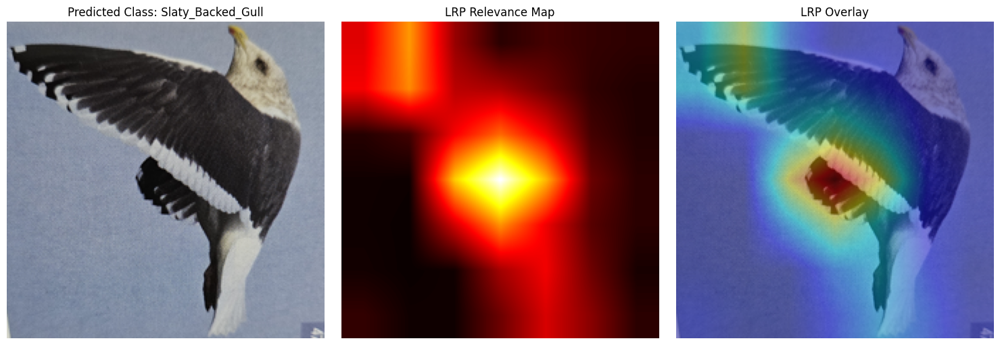

Processing: /content/drive/My Drive/FYP/BOOK_IMAGES_GULL/Slaty_Backed_Gull/20241204_170322.jpg


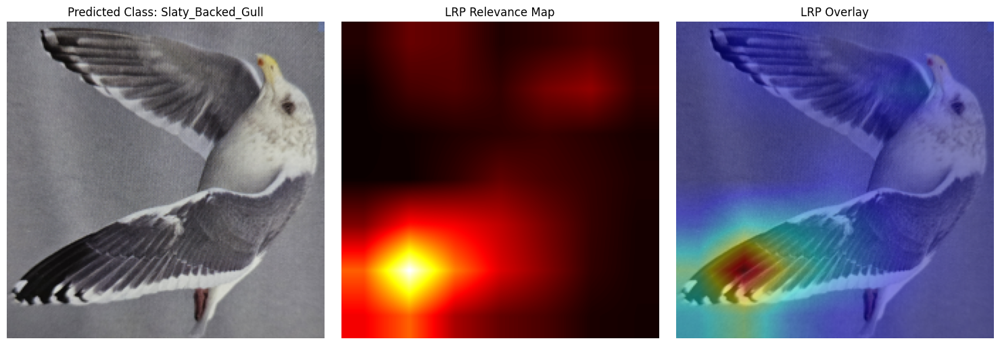

In [ ]:
!pip install captum
import os
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from captum.attr import LayerIntegratedGradients
from torch.autograd import Variable
import cv2

def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    return image_tensor

class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Load the trained model
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')), strict=False)
model.eval()

# Define class names
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']

def lrp(model, image_tensor, target_layer):
    lig = LayerIntegratedGradients(model, target_layer)
    attr_lrp, delta = lig.attribute(image_tensor, target=0, return_convergence_delta=True)
    return attr_lrp.squeeze().cpu().detach().numpy()

def process_lrp_map(lrp_map):
    # Sum across the channel dimension
    lrp_map = np.sum(np.abs(lrp_map), axis=0)

    # Normalize the map
    lrp_map = (lrp_map - lrp_map.min()) / (lrp_map.max() - lrp_map.min())

    # Resize to original image size
    lrp_map = cv2.resize(lrp_map, (224, 224))

    return lrp_map

def plot_comparative_visualizations(image_path, lrp_map, predicted_class):
    # Open and resize the original image
    image = Image.open(image_path).resize((224, 224))
    image = np.array(image)

    # Process the LRP map
    processed_lrp_map = process_lrp_map(lrp_map)

    # Create a heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * processed_lrp_map), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_RGB2BGR), 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # Plot
    plt.figure(figsize=(15, 5))

    # Predicted Class
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Predicted Class: {class_names[predicted_class]}")
    plt.axis('off')

    # LRP Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(processed_lrp_map, cmap='hot')
    plt.title("LRP Relevance Map")
    plt.axis('off')

    # Overlay
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("LRP Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def process_test_folder(test_folder_path):
    # Target the last convolutional layer
    target_layer = model.vgg.features[-1]

    # Process each image in the test folder
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            # Skip non-image files
            if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                continue

            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Get the predicted class
            with torch.no_grad():
                output = model(image_tensor)
                predicted_class_idx = torch.argmax(output, dim=1).item()

            # Generate LRP for each image
            lrp_map = lrp(model, image_tensor, target_layer)

            # Visualize results with predicted class
            plot_comparative_visualizations(image_path, lrp_map, predicted_class_idx)

# Run the combined implementation on all images in the test folder
test_folder_path = '/content/drive/My Drive/FYP/BOOK_IMAGES_GULL'
process_test_folder(test_folder_path)


In [ ]:
!pip install captum

In [ ]:
import os
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from captum.attr import DeepLift
from torch.autograd import Variable
import cv2

def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to VGG input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # ImageNet normalization
    ])
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    return image_tensor

class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Load the trained model
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')), strict=False)
model.eval()

# Define class names
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']

# DeepLIFT function using Captum's DeepLift
def deep_lift(model, image_tensor, target_layer):
    deep_lift = DeepLift(model)
    baseline = torch.zeros_like(image_tensor)  # Using a zero baseline
    attr, delta = deep_lift.attribute(image_tensor, baselines=baseline, target=0, return_convergence_delta=True)
    return attr.squeeze().cpu().detach().numpy()

def process_deep_lift_map(deep_lift_map):
    # Sum across the channel dimension
    deep_lift_map = np.sum(np.abs(deep_lift_map), axis=0)

    # Normalize the map
    deep_lift_map = (deep_lift_map - deep_lift_map.min()) / (deep_lift_map.max() - deep_lift_map.min())

    # Resize to original image size
    deep_lift_map = cv2.resize(deep_lift_map, (224, 224))

    return deep_lift_map

def plot_comparative_visualizations(image_path, deep_lift_map, predicted_class):
    # Open and resize the original image
    image = Image.open(image_path).resize((224, 224))
    image = np.array(image)

    # Process the DeepLIFT map
    processed_deep_lift_map = process_deep_lift_map(deep_lift_map)

    # Create a heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * processed_deep_lift_map), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_RGB2BGR), 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # Plot
    plt.figure(figsize=(15, 5))

    # Predicted Class
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Predicted Class: {class_names[predicted_class]}")
    plt.axis('off')

    # DeepLIFT Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(processed_deep_lift_map, cmap='hot')
    plt.title("DeepLIFT Relevance Map")
    plt.axis('off')

    # Overlay
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("DeepLIFT Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def process_test_folder(test_folder_path):
    # Target the last convolutional layer
    target_layer = model.vgg.features[-1]

    # Process each image in the test folder
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            # Skip non-image files
            if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                continue

            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Get the predicted class
            with torch.no_grad():
                output = model(image_tensor)
                predicted_class_idx = torch.argmax(output, dim=1).item()

            # Generate DeepLIFT for each image
            deep_lift_map = deep_lift(model, image_tensor, target_layer)

            # Visualize results with predicted class
            plot_comparative_visualizations(image_path, deep_lift_map, predicted_class_idx)

# Run the combined implementation on all images in the test folder
test_folder_path = '/content/drive/My Drive/FYP/BOOK_IMAGES_GULL'
process_test_folder(test_folder_path)


In [ ]:
!pip install captum
import os
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from captum.attr import DeepLift
from torch.autograd import Variable
import cv2

def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to VGG input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # ImageNet normalization
    ])
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    return image_tensor

class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Load the trained model
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')), strict=False)
model.eval()

# Define class names
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']

# DeepLIFT function using Captum's DeepLift
def deep_lift(model, image_tensor, target_layer):
    deep_lift = DeepLift(model)
    baseline = torch.zeros_like(image_tensor)  # Using a zero baseline
    attr, delta = deep_lift.attribute(image_tensor, baselines=baseline, target=0, return_convergence_delta=True)
    return attr.squeeze().cpu().detach().numpy()

def process_deep_lift_map(deep_lift_map):
    # Sum across the channel dimension
    deep_lift_map = np.sum(np.abs(deep_lift_map), axis=0)

    # Normalize the map
    deep_lift_map = (deep_lift_map - deep_lift_map.min()) / (deep_lift_map.max() - deep_lift_map.min())

    # Resize to original image size
    deep_lift_map = cv2.resize(deep_lift_map, (224, 224))

    return deep_lift_map

def plot_comparative_visualizations(image_path, deep_lift_map, predicted_class):
    # Open and resize the original image
    image = Image.open(image_path).resize((224, 224))
    image = np.array(image)

    # Process the DeepLIFT map
    processed_deep_lift_map = process_deep_lift_map(deep_lift_map)

    # Create a heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * processed_deep_lift_map), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_RGB2BGR), 0.6, heatmap, 0.4, 0)
    overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # Plot
    plt.figure(figsize=(15, 5))

    # Predicted Class
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Predicted Class: {class_names[predicted_class]}")
    plt.axis('off')

    # DeepLIFT Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(processed_deep_lift_map, cmap='hot')
    plt.title("DeepLIFT Relevance Map")
    plt.axis('off')

    # Overlay
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("DeepLIFT Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def process_test_folder(test_folder_path):
    # Target the last convolutional layer
    target_layer = model.vgg.features[-1]

    # Process each image in the test folder
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            # Skip non-image files
            if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                continue

            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Get the predicted class
            with torch.no_grad():
                output = model(image_tensor)
                predicted_class_idx = torch.argmax(output, dim=1).item()

            # Generate DeepLIFT for each image
            deep_lift_map = deep_lift(model, image_tensor, target_layer)

            # Visualize results with predicted class
            plot_comparative_visualizations(image_path, deep_lift_map, predicted_class_idx)

# Run the combined implementation on all images in the test folder
test_folder_path = '/content/drive/My Drive/FYP/BOOK_IMAGES_GULL'
process_test_folder(test_folder_path)


In [ ]:
# Install Captum if not already installed
# Uncomment the following line if running in an environment where Captum is not installed
!pip install captum

# Import necessary libraries
import os
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from captum.attr import DeepLift
import cv2

# Check for GPU availability and set device accordingly
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Function to preprocess images
def preprocess_image(image_path):
    """
    Preprocesses the input image for VGG16.

    Args:
        image_path (str): Path to the input image.

    Returns:
        torch.Tensor: Preprocessed image tensor.
    """
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to VGG16 input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet normalization
                             std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path).convert('RGB')  # Ensure image is in RGB
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    return image_tensor.to(device)

# Define the modified VGG16 model for binary classification
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        # Load pre-trained VGG16 model
        self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        # Modify the classifier to output 2 classes
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Function to load the trained model
def load_model(checkpoint_path):
    """
    Loads the trained VGG16Modified model from the checkpoint.

    Args:
        checkpoint_path (str): Path to the model checkpoint.

    Returns:
        nn.Module: Loaded model in evaluation mode.
    """
    model = VGG16Modified()
    # Load state dictionary with appropriate device mapping
    state_dict = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(state_dict, strict=False)
    model.to(device)
    model.eval()
    return model

# Define class names
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']

# DeepLIFT function using Captum's DeepLift
def deep_lift(model, image_tensor, target_class):
    """
    Computes the DeepLIFT attribution for a given image and target class.

    Args:
        model (nn.Module): The trained model.
        image_tensor (torch.Tensor): Preprocessed image tensor.
        target_class (int): Index of the target class for attribution.

    Returns:
        np.ndarray: Attribution map as a NumPy array.
    """
    # Initialize DeepLift
    deep_lift = DeepLift(model)
    # Define baseline (zero tensor)
    baseline = torch.zeros_like(image_tensor).to(device)
    # Compute attributions
    attr, delta = deep_lift.attribute(
        image_tensor,
        baselines=baseline,
        target=target_class,
        return_convergence_delta=True
    )
    return attr.squeeze().cpu().detach().numpy()

# Function to process and normalize the DeepLIFT attribution map
def process_deep_lift_map(deep_lift_map):
    """
    Processes the raw DeepLIFT attribution map.

    Args:
        deep_lift_map (np.ndarray): Raw attribution map.

    Returns:
        np.ndarray: Processed and normalized attribution map.
    """
    # Sum absolute attributions across channels
    deep_lift_map = np.sum(np.abs(deep_lift_map), axis=0)
    # Normalize the map to [0, 1]
    deep_lift_map = (deep_lift_map - deep_lift_map.min()) / (deep_lift_map.max() - deep_lift_map.min() + 1e-8)
    # Resize to original image size (optional, here it's already 224x224)
    # deep_lift_map = cv2.resize(deep_lift_map, (224, 224))
    return deep_lift_map

# Function to plot and visualize the results
def plot_comparative_visualizations(image_path, deep_lift_map, predicted_class):
    """
    Plots the original image, DeepLIFT heatmap, and overlay.

    Args:
        image_path (str): Path to the input image.
        deep_lift_map (np.ndarray): Processed DeepLIFT attribution map.
        predicted_class (int): Index of the predicted class.
    """
    # Open and resize the original image
    image = Image.open(image_path).convert('RGB').resize((224, 224))
    image = np.array(image)

    # Process the DeepLIFT map
    processed_deep_lift_map = process_deep_lift_map(deep_lift_map)

    # Create a heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * processed_deep_lift_map), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = (0.6 * image + 0.4 * heatmap).astype(np.uint8)

    # Plotting
    plt.figure(figsize=(18, 6))

    # Original Image with Predicted Class
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Original Image\nPredicted Class: {class_names[predicted_class]}")
    plt.axis('off')

    # DeepLIFT Heatmap with Color Bar
    plt.subplot(1, 3, 2)
    plt.imshow(processed_deep_lift_map, cmap='hot')
    plt.title("DeepLIFT Relevance Map")
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)

    # Overlay of Heatmap on Original Image
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("DeepLIFT Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to process all images in the test folder
def process_test_folder(test_folder_path, model):
    """
    Processes each image in the test folder, generates DeepLIFT attributions, and visualizes them.

    Args:
        test_folder_path (str): Path to the folder containing test images.
        model (nn.Module): The trained model.
    """
    # Iterate through all files in the test folder
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            # Check for image file extensions
            if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                print(f"Skipping non-image file: {file}")
                continue

            image_path = os.path.join(root, file)
            print(f"\nProcessing: {image_path}")

            try:
                # Preprocess the image
                image_tensor = preprocess_image(image_path)

                # Get model prediction
                with torch.no_grad():
                    output = model(image_tensor)
                    probabilities = torch.softmax(output, dim=1)
                    predicted_class_idx = torch.argmax(probabilities, dim=1).item()
                    predicted_class_prob = probabilities[0, predicted_class_idx].item()
                    print(f"Predicted Class: {class_names[predicted_class_idx]} (Probability: {predicted_class_prob:.4f})")

                # Generate DeepLIFT attribution map for the predicted class
                deep_lift_map = deep_lift(model, image_tensor, predicted_class_idx)

                # Visualize the results
                plot_comparative_visualizations(image_path, deep_lift_map, predicted_class_idx)

            except Exception as e:
                print(f"Error processing {image_path}: {e}")

# Main execution block
if __name__ == "__main__":
    # Path to the trained model checkpoint
    checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'

    # Load the model
    model = load_model(checkpoint_path)
    print("Model loaded successfully.")

    # Path to the test images folder
    test_folder_path = '/content/drive/My Drive/FYP/BOOK_IMAGES_GULL'

    # Process and visualize DeepLIFT attributions for all images in the test folder
    process_test_folder(test_folder_path, model)


In [ ]:
# Install Captum if not already installed
# Uncomment the following line if running in an environment where Captum is not installed
!pip install captum

# Import necessary libraries
import os
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from captum.attr import DeepLift
import cv2

# Check for GPU availability and set device accordingly
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Function to preprocess images
def preprocess_image(image_path):
    """
    Preprocesses the input image for VGG16.

    Args:
        image_path (str): Path to the input image.

    Returns:
        torch.Tensor: Preprocessed image tensor.
    """
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to VGG16 input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet normalization
                             std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path).convert('RGB')  # Ensure image is in RGB
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    return image_tensor.to(device)

# Define the modified VGG16 model for binary classification
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        # Load pre-trained VGG16 model
        self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        # Modify the classifier to output 2 classes
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Function to load the trained model
def load_model(checkpoint_path):
    """
    Loads the trained VGG16Modified model from the checkpoint.

    Args:
        checkpoint_path (str): Path to the model checkpoint.

    Returns:
        nn.Module: Loaded model in evaluation mode.
    """
    model = VGG16Modified()
    # Load state dictionary with appropriate device mapping
    state_dict = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(state_dict, strict=False)
    model.to(device)
    model.eval()
    return model

# Define class names
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']

# DeepLIFT function using Captum's DeepLift
def deep_lift(model, image_tensor, target_class):
    """
    Computes the DeepLIFT attribution for a given image and target class.

    Args:
        model (nn.Module): The trained model.
        image_tensor (torch.Tensor): Preprocessed image tensor.
        target_class (int): Index of the target class for attribution.

    Returns:
        np.ndarray: Attribution map as a NumPy array.
    """
    # Initialize DeepLift
    deep_lift = DeepLift(model)
    # Define baseline (zero tensor)
    baseline = torch.zeros_like(image_tensor).to(device)
    # Compute attributions
    attr, delta = deep_lift.attribute(
        image_tensor,
        baselines=baseline,
        target=target_class,
        return_convergence_delta=True
    )
    return attr.squeeze().cpu().detach().numpy()

# Function to process and normalize the DeepLIFT attribution map
def process_deep_lift_map(deep_lift_map):
    """
    Processes the raw DeepLIFT attribution map.

    Args:
        deep_lift_map (np.ndarray): Raw attribution map.

    Returns:
        np.ndarray: Processed and normalized attribution map.
    """
    # Sum absolute attributions across channels
    deep_lift_map = np.sum(np.abs(deep_lift_map), axis=0)
    # Normalize the map to [0, 1]
    deep_lift_map = (deep_lift_map - deep_lift_map.min()) / (deep_lift_map.max() - deep_lift_map.min() + 1e-8)
    # Resize to original image size (optional, here it's already 224x224)
    # deep_lift_map = cv2.resize(deep_lift_map, (224, 224))
    return deep_lift_map

# Function to plot and visualize the results
def plot_comparative_visualizations(image_path, deep_lift_map, predicted_class):
    """
    Plots the original image, DeepLIFT heatmap, and overlay.

    Args:
        image_path (str): Path to the input image.
        deep_lift_map (np.ndarray): Processed DeepLIFT attribution map.
        predicted_class (int): Index of the predicted class.
    """
    # Open and resize the original image
    image = Image.open(image_path).convert('RGB').resize((224, 224))
    image = np.array(image)

    # Process the DeepLIFT map
    processed_deep_lift_map = process_deep_lift_map(deep_lift_map)

    # Create a heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * processed_deep_lift_map), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = (0.6 * image + 0.4 * heatmap).astype(np.uint8)

    # Plotting
    plt.figure(figsize=(18, 6))

    # Original Image with Predicted Class
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Original Image\nPredicted Class: {class_names[predicted_class]}")
    plt.axis('off')

    # DeepLIFT Heatmap with Color Bar
    plt.subplot(1, 3, 2)
    plt.imshow(processed_deep_lift_map, cmap='hot')
    plt.title("DeepLIFT Relevance Map")
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)

    # Overlay of Heatmap on Original Image
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("DeepLIFT Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to process all images in the test folder
def process_test_folder(test_folder_path, model):
    """
    Processes each image in the test folder, generates DeepLIFT attributions, and visualizes them.

    Args:
        test_folder_path (str): Path to the folder containing test images.
        model (nn.Module): The trained model.
    """
    # Iterate through all files in the test folder
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            # Check for image file extensions
            if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                print(f"Skipping non-image file: {file}")
                continue

            image_path = os.path.join(root, file)
            print(f"\nProcessing: {image_path}")

            try:
                # Preprocess the image
                image_tensor = preprocess_image(image_path)

                # Get model prediction
                with torch.no_grad():
                    output = model(image_tensor)
                    probabilities = torch.softmax(output, dim=1)
                    predicted_class_idx = torch.argmax(probabilities, dim=1).item()
                    predicted_class_prob = probabilities[0, predicted_class_idx].item()
                    print(f"Predicted Class: {class_names[predicted_class_idx]} (Probability: {predicted_class_prob:.4f})")

                # Generate DeepLIFT attribution map for the predicted class
                deep_lift_map = deep_lift(model, image_tensor, predicted_class_idx)

                # Visualize the results
                plot_comparative_visualizations(image_path, deep_lift_map, predicted_class_idx)

            except Exception as e:
                print(f"Error processing {image_path}: {e}")

# Main execution block
if __name__ == "__main__":
    # Path to the trained model checkpoint
    checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ3latst_20250210/best_model_vgg_20250210.pth'

    # Load the model
    model = load_model(checkpoint_path)
    print("Model loaded successfully.")

    # Path to the test images folder
    test_folder_path = '/content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull'

    # Process and visualize DeepLIFT attributions for all images in the test folder
    process_test_folder(test_folder_path, model)


  Using cached captum-0.7.0-py3-none-any.whl.metadata (26 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.5.147-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.6.1.9-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.3.1.170-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-manylinu

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 140MB/s]
<ipython-input-1-85614b5b0336>:70: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. P

Model loaded successfully.

Processing: /content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull/011sm.jpg
Predicted Class: Slaty_Backed_Gull (Probability: 1.0000)


/usr/local/lib/python3.11/dist-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(


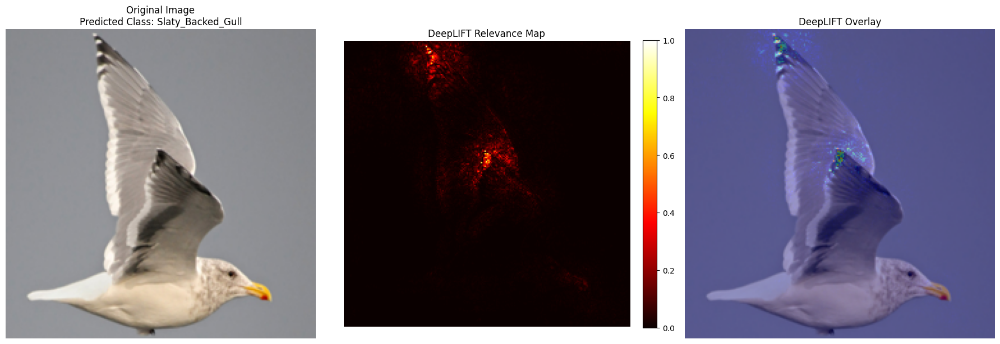


Processing: /content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull/480 (42).jpeg
Predicted Class: Slaty_Backed_Gull (Probability: 1.0000)


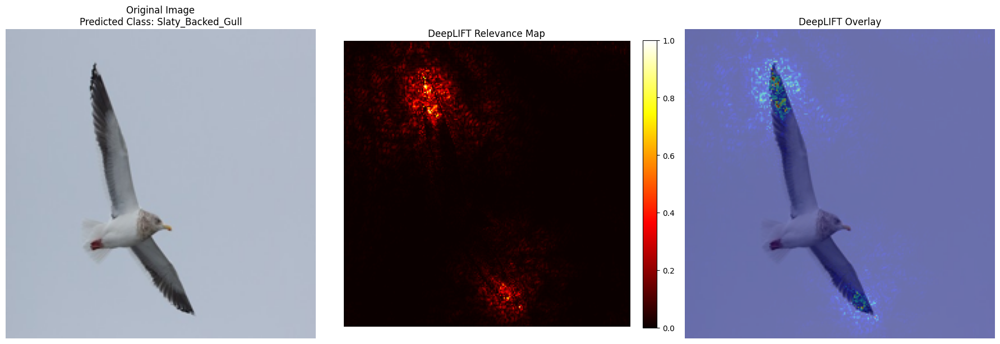


Processing: /content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull/480 (9).jpeg
Predicted Class: Slaty_Backed_Gull (Probability: 1.0000)


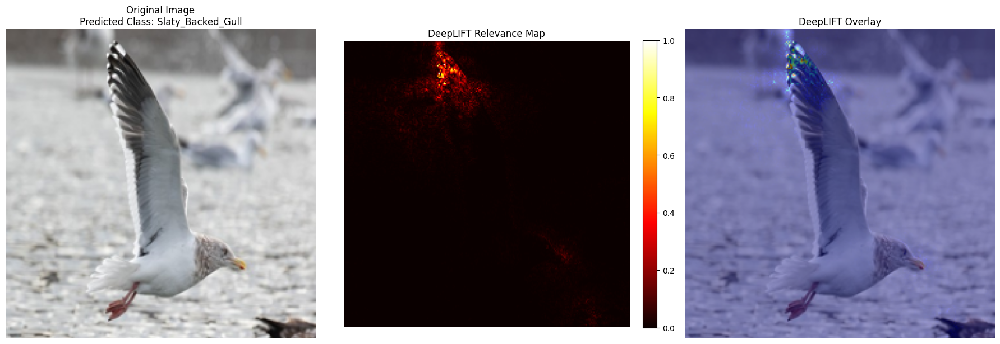


Processing: /content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull/480 (52).jpeg
Predicted Class: Slaty_Backed_Gull (Probability: 1.0000)


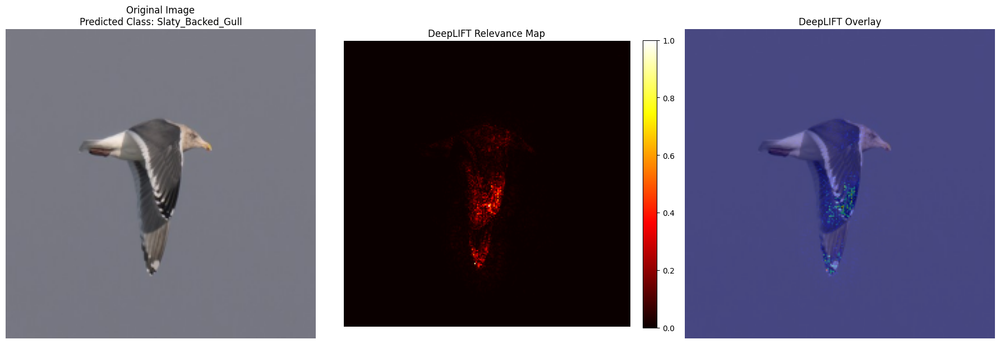


Processing: /content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull/007.jpg
Predicted Class: Slaty_Backed_Gull (Probability: 0.9999)


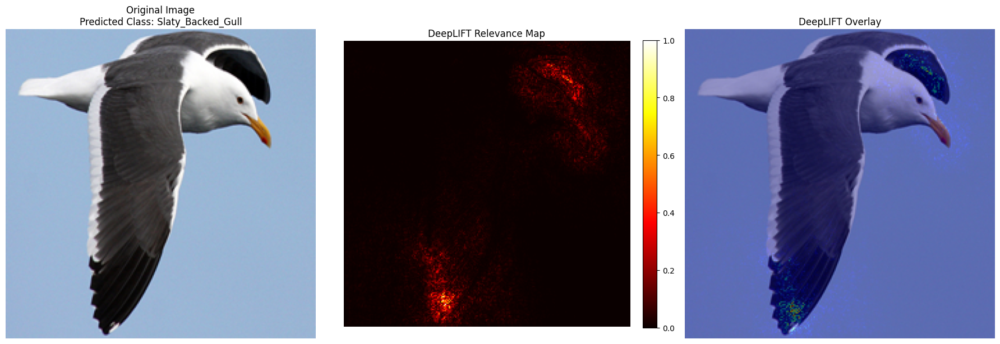


Processing: /content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull/480 (21).jpeg
Predicted Class: Slaty_Backed_Gull (Probability: 1.0000)


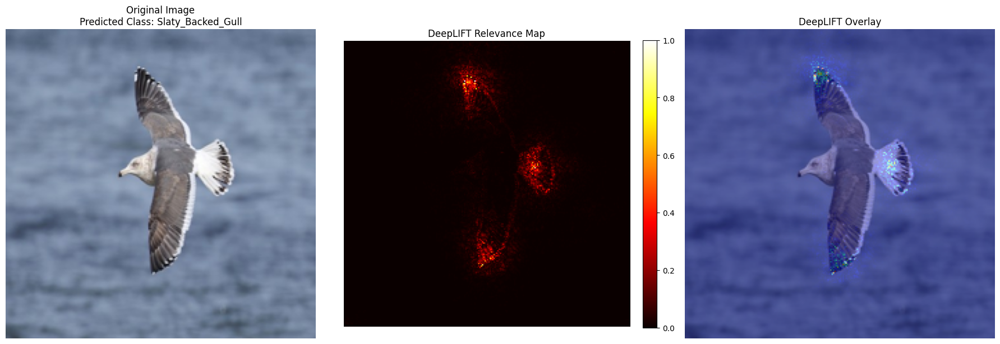


Processing: /content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull/480 (33).jpeg
Predicted Class: Slaty_Backed_Gull (Probability: 1.0000)


In [ ]:
# Install Captum if not already installed
# Uncomment the following line if running in an environment where Captum is not installed
!pip install captum

# Import necessary libraries
import os
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from captum.attr import DeepLift
import cv2

# Check for GPU availability and set device accordingly
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Function to preprocess images
def preprocess_image(image_path):
    """
    Preprocesses the input image for VGG16.

    Args:
        image_path (str): Path to the input image.

    Returns:
        torch.Tensor: Preprocessed image tensor.
    """
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to VGG16 input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet normalization
                             std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path).convert('RGB')  # Ensure image is in RGB
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    return image_tensor.to(device)

# Define the modified VGG16 model for binary classification
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        # Load pre-trained VGG16 model
        self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        # Modify the classifier to output 2 classes
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)  # Binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Function to load the trained model
def load_model(checkpoint_path):
    """
    Loads the trained VGG16Modified model from the checkpoint.

    Args:
        checkpoint_path (str): Path to the model checkpoint.

    Returns:
        nn.Module: Loaded model in evaluation mode.
    """
    model = VGG16Modified()
    # Load state dictionary with appropriate device mapping
    state_dict = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(state_dict, strict=False)
    model.to(device)
    model.eval()
    return model

# Define class names
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']

# DeepLIFT function using Captum's DeepLift
def deep_lift(model, image_tensor, target_class):
    """
    Computes the DeepLIFT attribution for a given image and target class.

    Args:
        model (nn.Module): The trained model.
        image_tensor (torch.Tensor): Preprocessed image tensor.
        target_class (int): Index of the target class for attribution.

    Returns:
        np.ndarray: Attribution map as a NumPy array.
    """
    # Initialize DeepLift
    deep_lift = DeepLift(model)
    # Define baseline (zero tensor)
    baseline = torch.zeros_like(image_tensor).to(device)
    # Compute attributions
    attr, delta = deep_lift.attribute(
        image_tensor,
        baselines=baseline,
        target=target_class,
        return_convergence_delta=True
    )
    return attr.squeeze().cpu().detach().numpy()

# Function to process and normalize the DeepLIFT attribution map
def process_deep_lift_map(deep_lift_map):
    """
    Processes the raw DeepLIFT attribution map.

    Args:
        deep_lift_map (np.ndarray): Raw attribution map.

    Returns:
        np.ndarray: Processed and normalized attribution map.
    """
    # Sum absolute attributions across channels
    deep_lift_map = np.sum(np.abs(deep_lift_map), axis=0)
    # Normalize the map to [0, 1]
    deep_lift_map = (deep_lift_map - deep_lift_map.min()) / (deep_lift_map.max() - deep_lift_map.min() + 1e-8)
    # Resize to original image size (optional, here it's already 224x224)
    # deep_lift_map = cv2.resize(deep_lift_map, (224, 224))
    return deep_lift_map

# Function to plot and visualize the results
def plot_comparative_visualizations(image_path, deep_lift_map, predicted_class):
    """
    Plots the original image, DeepLIFT heatmap, and overlay.

    Args:
        image_path (str): Path to the input image.
        deep_lift_map (np.ndarray): Processed DeepLIFT attribution map.
        predicted_class (int): Index of the predicted class.
    """
    # Open and resize the original image
    image = Image.open(image_path).convert('RGB').resize((224, 224))
    image = np.array(image)

    # Process the DeepLIFT map
    processed_deep_lift_map = process_deep_lift_map(deep_lift_map)

    # Create a heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * processed_deep_lift_map), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = (0.6 * image + 0.4 * heatmap).astype(np.uint8)

    # Plotting
    plt.figure(figsize=(18, 6))

    # Original Image with Predicted Class
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Original Image\nPredicted Class: {class_names[predicted_class]}")
    plt.axis('off')

    # DeepLIFT Heatmap with Color Bar
    plt.subplot(1, 3, 2)
    plt.imshow(processed_deep_lift_map, cmap='hot')
    plt.title("DeepLIFT Relevance Map")
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)

    # Overlay of Heatmap on Original Image
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("DeepLIFT Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to process all images in the test folder
def process_test_folder(test_folder_path, model):
    """
    Processes each image in the test folder, generates DeepLIFT attributions, and visualizes them.

    Args:
        test_folder_path (str): Path to the folder containing test images.
        model (nn.Module): The trained model.
    """
    # Iterate through all files in the test folder
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            # Check for image file extensions
            if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                print(f"Skipping non-image file: {file}")
                continue

            image_path = os.path.join(root, file)
            print(f"\nProcessing: {image_path}")

            try:
                # Preprocess the image
                image_tensor = preprocess_image(image_path)

                # Get model prediction
                with torch.no_grad():
                    output = model(image_tensor)
                    probabilities = torch.softmax(output, dim=1)
                    predicted_class_idx = torch.argmax(probabilities, dim=1).item()
                    predicted_class_prob = probabilities[0, predicted_class_idx].item()
                    print(f"Predicted Class: {class_names[predicted_class_idx]} (Probability: {predicted_class_prob:.4f})")

                # Generate DeepLIFT attribution map for the predicted class
                deep_lift_map = deep_lift(model, image_tensor, predicted_class_idx)

                # Visualize the results
                plot_comparative_visualizations(image_path, deep_lift_map, predicted_class_idx)

            except Exception as e:
                print(f"Error processing {image_path}: {e}")

# Main execution block
if __name__ == "__main__":
    # Path to the trained model checkpoint
    checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'

    # Load the model
    model = load_model(checkpoint_path)
    print("Model loaded successfully.")

    # Path to the test images folder
    test_folder_path = '/content/drive/My Drive/FYP/Dataset/HQ3/train/Slaty_Backed_Gull'

    # Process and visualize DeepLIFT attributions for all images in the test folder
    process_test_folder(test_folder_path, model)
